# Exploring Diverse Perspectives on Death in Song Lyrics
Death is a uniquely complex and deeply philosophical topic that many people have habitually avoided over the years. Based on various culture, religious, and personal beliefs, people's understanding of death shows many different perspectives, which is also reflected in music.

This project aims to use topic modelling to find out the diverse ways of expressing death in song lyrics.

# Code Notebook

## 0 Import Packages 

In [1]:
#import all necessary packages 
import numpy as np
import pandas as pd 
from collections import Counter
from sklearn.feature_extraction import _stop_words as stop_words 
from nltk.stem.porter import PorterStemmer
stemmer = PorterStemmer()
import nltk
nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer
lem = WordNetLemmatizer()
from sklearn.metrics.pairwise import cosine_similarity as cosine
from sklearn.feature_extraction.text import CountVectorizer
from nltk.tokenize import word_tokenize
from nltk.corpus import wordnet
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
import matplotlib.pyplot as plt
from wordcloud import WordCloud

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\YYY70\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## 1 Analyze Raw Data

### 1.1 Count Frequency of 'Death' Words
In this part, I count and sort the number of whole words that appear in lyrics, and try to find out how many times that word "death" appears in lyrics, and is it necessary to expand the dataset with "die" "dying" "kill" or other related words.

In [2]:
# Steps in this cell
## 1.Import the data file and tokenize the lyrics
## 2.Count the number of words that appear in the lyrics and sort them

data = pd.read_csv('../Qiaoyu-NLP-Project/tcc_ceds_music.csv')
lyrics = data.iloc[:, 5].values
tokenized_lyrics = [word_tokenize(lyric) for lyric in lyrics]

all_lyricwords = [word for tokens in tokenized_lyrics for word in tokens]
word_counts = Counter(all_lyricwords)
sorted_word_counts = word_counts.most_common()

for word, count in sorted_word_counts[:500]:
    print("{}: {}".format(word,count))

know: 33526
like: 29649
time: 26504
come: 23619
na: 18052
go: 17032
feel: 16795
yeah: 16787
away: 16773
heart: 16737
life: 15906
want: 14303
cause: 14265
baby: 13707
right: 12977
live: 12806
leave: 12790
tell: 11947
night: 11920
think: 11389
world: 10519
need: 10424
long: 10376
gon: 10317
look: 10062
break: 10016
good: 9984
hold: 9822
fall: 9358
hear: 9044
mind: 8767
dream: 8069
say: 7969
hand: 7793
wan: 7741
home: 7733
eye: 7373
little: 7233
play: 6967
lose: 6800
better: 6774
walk: 6736
fuck: 6699
stay: 6579
head: 6489
turn: 6483
believe: 6441
stand: 6428
girl: 6419
change: 6368
sing: 6289
things: 5754
take: 5691
start: 5684
face: 5558
blue: 5557
tear: 5399
tonight: 5327
money: 5236
inside: 5110
place: 5010
song: 4848
shit: 4829
bring: 4828
people: 4818
love: 4765
light: 4748
word: 4655
stop: 4601
sweet: 4570
hard: 4555
black: 4404
got: 4368
ta: 4368
true: 4360
remember: 4339
lonely: 4213
give: 4209
kiss: 4190
thing: 4170
bitch: 4165
days: 4122
real: 4013
watch: 3996
fight: 3939
soul:

### 1.2 Find the Impact of 'Death' in Different Features 
By calculating and comparing the percentage of features like 'genre', 'released_date' and 'topic' in both whole lyrics and lyrics contain 'death', this part aims to analyze the potential impact of death-related words on various features.

Comparison of genre percentages:


,Genre in whole dataset,Genre in Contain_death dataset
genre,,
blues,16.23%,15.34%
country,19.19%,15.82%
hip hop,3.19%,4.47%
jazz,13.55%,12.77%
pop,24.82%,21.56%
reggae,8.80%,11.73%
rock,14.22%,18.31%


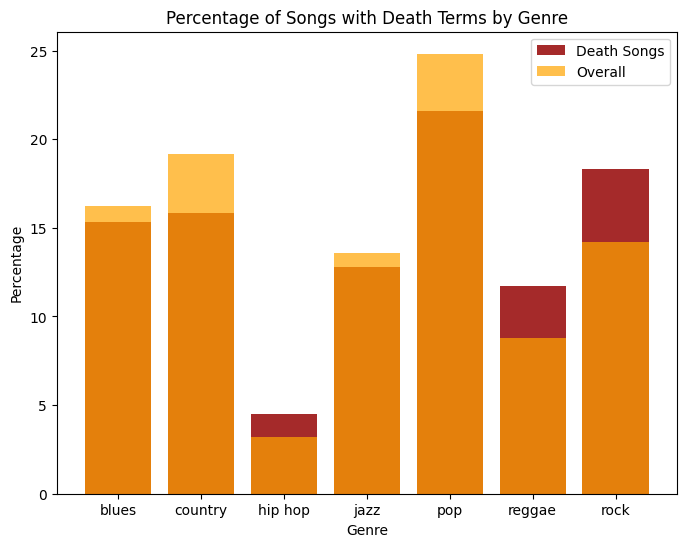

In [8]:
# Steps in these cells
## 1.Determine the filter terms and extract rows with term words
## 2.Calculate the proportion of each features in both lyrics and lyrics-contain-death data
## 3.Use plt to display the result

terms = ["death", "die", "kill"]
contains_death = [any((term in lyric) for term in terms) for lyric in tokenized_lyrics]

genre_counts_with_terms = data[contains_death].groupby('genre').size()
percentage_by_genre_death = (genre_counts_with_terms /genre_counts_with_terms.sum()) * 100
genre_counts = data.groupby('genre').size()
percentage_by_genre_raw = (genre_counts / genre_counts.sum()) * 100

# Asking CHATGPT the code structure and modify the content
comparison_df_Genre = pd.DataFrame({
        'Genre in whole dataset': percentage_by_genre_raw,
        'Genre in Contain_death dataset': percentage_by_genre_death,
    })
print("Comparison of genre percentages:")
display(comparison_df_Genre.style.format("{:.2f}%"))

#Find plt code in STEM-Lecture-Notebook
plt.figure(figsize=(8, 6))
plt.bar(percentage_by_genre_death.index, percentage_by_genre_death, label='Death Songs',color= 'brown')
plt.bar(percentage_by_genre_raw.index, percentage_by_genre_raw, alpha=0.7, label='Overall',color = 'orange')
plt.xlabel('Genre')
plt.ylabel('Percentage')
plt.title('Percentage of Songs with Death Terms by Genre')
plt.legend()
plt.show()

Comparison of Release_Date percentages:


C:\Users\YYY70\AppData\Local\Temp\ipykernel_15588\4074055781.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  date_counts_with_terms = data[contains_death].groupby('decade').size()
C:\Users\YYY70\AppData\Local\Temp\ipykernel_15588\4074055781.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  date_counts = data.groupby('decade').size()


,Release_Date Percentage in Raw dataset,Release_Date Percentage in Contain_death dataset
decade,,
1950,5.17%,3.17%
1960,12.02%,8.53%
1970,13.93%,11.43%
1980,16.48%,17.03%
1990,15.71%,17.30%
2000,16.85%,19.43%
2010,19.85%,23.10%


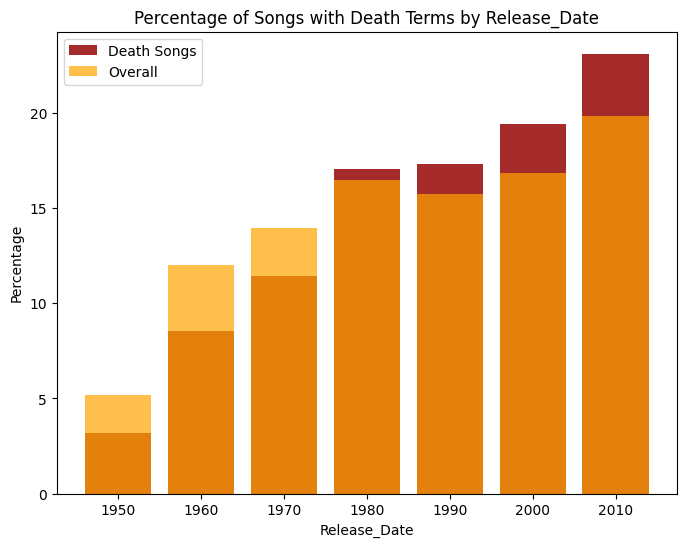

In [9]:
# Calculate the percentage of each genre and release_date in data_contain_death dataset
# Because the data has a lot of years, which would be hard to display proportion clearly, so I transform them into decades
data['release_date'] = data['release_date'].astype(str)
data['decade'] = (data['release_date'].str[:-1] + '0').astype('category')
date_counts_with_terms = data[contains_death].groupby('decade').size()
percentage_by_date_death = (date_counts_with_terms /date_counts_with_terms.sum()) * 100
date_counts = data.groupby('decade').size()
percentage_by_date_raw = (date_counts / date_counts.sum()) * 100

# # Asking CHATGPT the code structure and modify the content
comparison_df_Date = pd.DataFrame({
        'Release_Date Percentage in Raw dataset': percentage_by_date_raw,
        'Release_Date Percentage in Contain_death dataset': percentage_by_date_death,
    })
print("Comparison of Release_Date percentages:")
display(comparison_df_Date.style.format("{:.2f}%"))

#Find plt code in STEM-Lecture-Notebook
plt.figure(figsize=(8, 6))
plt.bar(percentage_by_date_death.index, percentage_by_date_death, label='Death Songs',color= 'brown')
plt.bar(percentage_by_date_raw.index, percentage_by_date_raw, alpha=0.7, label='Overall',color = 'orange')
plt.xlabel('Release_Date')
plt.ylabel('Percentage')
plt.title('Percentage of Songs with Death Terms by Release_Date')
plt.legend()
plt.show()

Comparison of Topic percentages:


,Topic Percentage in Raw dataset,Topic Percentage in Contain_death dataset
topic,,
feelings,2.16%,0.56%
music,8.12%,3.38%
night/time,6.43%,2.13%
obscene,17.21%,18.99%
romantic,5.37%,1.69%
sadness,21.49%,13.45%
violence,20.13%,46.95%
world/life,19.10%,12.86%


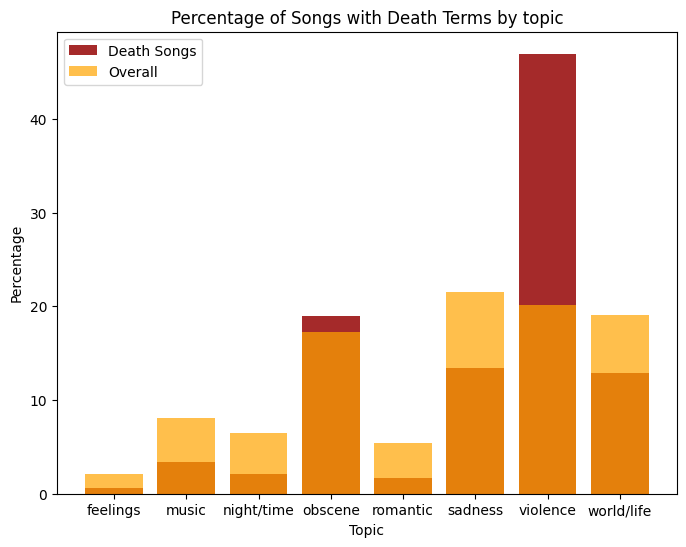

In [10]:
# Calculate the percentage of each topic in data_contain_death dataset
# Because the data has a lot of years, which would be hard to display proportion clearly, so I transform them into decades
topic_counts_with_terms = data[contains_death].groupby('topic').size()
percentage_by_topic_death = (topic_counts_with_terms /topic_counts_with_terms.sum()) * 100
topic_counts = data.groupby('topic').size()
percentage_by_topic_raw = (topic_counts / topic_counts.sum()) * 100

# # Asking CHATGPT the code structure and modify the content
comparison_df_topic = pd.DataFrame({
        'Topic Percentage in Raw dataset': percentage_by_topic_raw,
        'Topic Percentage in Contain_death dataset': percentage_by_topic_death,
    })
print("Comparison of Topic percentages:")
display(comparison_df_topic.style.format("{:.2f}%"))

#Find plt code in STEM-Lecture-Notebook
plt.figure(figsize=(8, 6))
plt.bar(percentage_by_topic_death.index, percentage_by_topic_death, label='Death Songs',color= 'brown')
plt.bar(percentage_by_topic_raw.index, percentage_by_topic_raw, alpha=0.7, label='Overall',color = 'orange')
plt.xlabel('Topic')
plt.ylabel('Percentage')
plt.title('Percentage of Songs with Death Terms by topic')
plt.legend()
plt.show()

## 2 Process Dataset for Topic Modelling

### 2.1 Prepare a new dataset for 'death' lyrics
This part aims to bulid a new 'death' dataset by cleaning the original dataset and retaining useful data for next steps.

Then based on the new death-dataset, bulid bag-of-word for topic modelling.

In [11]:
# Steps in this cell
## 1.Determine the filter terms and clean dataset to songs contain terms

terms = ["death", "die", "kill"]
contains_death = [any((term in lyric) for term in terms) for lyric in tokenized_lyrics]
rows_with_death = data[contains_death]
data_death = pd.DataFrame(rows_with_death).reset_index(drop=True)
data_death = data_death.drop(columns=['Unnamed: 0','age'])
data_death = data_death.drop(columns=data_death.columns[5:-2])
data_death

,artist_name,track_name,release_date,genre,lyrics,topic,decade
0,frankie laine,i believe,1950,pop,believe drop rain fall grow believe darkest ni...,world/life,1950
1,perry como,round and round (with mitchell ayres and his o...,1950,pop,convoy light dead ahead merchantmen trump dies...,violence,1950
2,frankie laine,necessary evil,1951,pop,come motherfucker spit shit minutes chillin bi...,obscene,1950
3,les paul,dark eyes,1951,pop,light bright dark shit backstage alright cause...,violence,1950
4,mohammed rafi,jahan men log sachhe ashikon ko,1952,pop,park bag pack kind heart look comfortable glow...,sadness,1950
...,...,...,...,...,...,...,...
3371,ghostface killah,the champ,2019,hip hop,bulldozer wreck ball attach leave ring tread m...,obscene,2010
3372,denzel curry,gook,2019,hip hop,gook tell wasn nigga wouldn tell truth high sc...,obscene,2010
3373,future,tony montana,2019,hip hop,fuckin cockroaches motherfuckin freebandz want...,obscene,2010
3374,ja rule,kill 'em all,2019,hip hop,spit shit damn nigga ridiculous nigga lose inc...,obscene,2010


In [12]:
# Steps in this cell
## 1.Determine the filter terms and extract lyric-rows with them
## 2.Tokenize the filtered lyrics and create bag-of-words

# Reference in this cell
## Finding the code in lecture-4-notebook

death_lyrics = data_death.iloc[:, 4].values
tokenized_death_lyrics = [word_tokenize(lyric) for lyric in death_lyrics]
count_vectorizer = CountVectorizer(tokenizer=lambda x: x, lowercase=False)
bag_of_words = count_vectorizer.fit_transform(tokenized_death_lyrics)

# # Creates a DataFrame from our bag_of_words matrix
vocab = count_vectorizer.get_feature_names_out()
bag_of_words_df = pd.DataFrame(bag_of_words.todense(), columns = vocab)

# # Add the 'genre' and 'release_date' columns back to the DataFrame
bag_of_words_df['track_name'] = data_death.iloc[:, 1].values

# # Calculate TF for each term in the entire dataset
book_tf = bag_of_words_df[terms].sum() / bag_of_words.sum()
book_tf, bag_of_words_df

d:\conda1\Lib\site-packages\sklearn\feature_extraction\text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


(death    0.005983
 die      0.006738
 kill     0.011343
 dtype: float64,
       aaaaaaaaaaah  aaaaaaaaaah  aaaaah  aaaah  aaaayo  aaah  aaahhh  aaahhhh  \
 0                0            0       0      0       0     0       0        0   
 1                0            0       0      0       0     0       0        0   
 2                0            0       0      0       0     0       0        0   
 3                0            0       0      0       0     0       0        0   
 4                0            0       0      0       0     0       0        0   
 ...            ...          ...     ...    ...     ...   ...     ...      ...   
 3371             0            0       0      0       0     0       0        0   
 3372             0            0       0      0       0     0       0        0   
 3373             0            0       0      0       0     0       0        0   
 3374             0            0       0      0       0     0       0        0   
 3375             0     

### 2.2 Prepare a sample dataset for comparing results
This part creates a dataset which is sampled the same rows of death-dataset from the whole data. 

The purpose is to campare the result of following topic modelling and find out the impact of death word.

In [13]:
sampled_data = data.sample(n=3375, random_state=42)
sampled_data = pd.DataFrame(sampled_data).reset_index(drop=True)
sampled_data = sampled_data.drop(columns=['Unnamed: 0','age'])
sampled_data = sampled_data.drop(columns=sampled_data.columns[5:-1])
sampled_data

,artist_name,track_name,release_date,genre,lyrics,decade
0,jakob ogawa,velvet light,2018,rock,mind fade pink cashmere summer nights summer n...,2010
1,the killers,"andy, you're a star",2004,rock,field remember incredible shut shut yeah field...,2000
2,wings,with a little luck,1978,pop,little luck help damn thing work little feel e...,1970
3,diablo swing orchestra,voodoo mon amour,2012,jazz,insert needle break stand fall consider bewild...,2010
4,emmylou harris,gulf coast highway (with willie nelson),1990,country,gulf coast highway work rail work field cold d...,1990
...,...,...,...,...,...,...
3370,the cars,since you're gone,1981,pop,go nights gettin strange go makin sense go stu...,1980
3371,the psychedelic furs,president gas,1980,pop,party state like vote change right like mess y...,1980
3372,dolly parton,with you gone,1978,country,go sit lonely room star wall lack count tear f...,1970
3373,the mamas & the papas,creeque alley,1967,pop,creeque mitchy gettin kind itchy leave folk mu...,1960


In [14]:
sampled_lyrics = sampled_data.iloc[:, 4].values
tokenized_sampled_lyrics = [word_tokenize(sampled_lyric) for sampled_lyric in sampled_lyrics]
count_vectorizer = CountVectorizer(tokenizer=lambda x: x, lowercase=False)
sampled_bag_of_words = count_vectorizer.fit_transform(tokenized_sampled_lyrics)

# # Creates a DataFrame from our bag_of_words matrix
vocab = count_vectorizer.get_feature_names_out()
sampled_bag_of_words_df = pd.DataFrame(sampled_bag_of_words.todense(), columns = vocab)

# # Add the 'genre' and 'release_date' columns back to the DataFrame
sampled_bag_of_words_df['track_name'] = sampled_data.iloc[:, 1].values

# # Calculate TF for each term in the entire dataset
sampled_book_tf = sampled_bag_of_words_df[terms].sum() / sampled_bag_of_words.sum()
sampled_book_tf, sampled_bag_of_words_df

d:\conda1\Lib\site-packages\sklearn\feature_extraction\text.py:525: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


(death    0.000720
 die      0.000994
 kill     0.001559
 dtype: float64,
       aaaa  aaaaaaa  aaaaaaaaaah  aaaaah  aaaayo  aaagh  aaah  aaayyyy  aahah  \
 0        0        0            0       0       0      0     0        0      0   
 1        0        0            0       0       0      0     0        0      0   
 2        0        0            0       0       0      0     0        0      0   
 3        0        0            0       0       0      0     0        0      0   
 4        0        0            0       0       0      0     0        0      0   
 ...    ...      ...          ...     ...     ...    ...   ...      ...    ...   
 3370     0        0            0       0       0      0     0        0      0   
 3371     0        0            0       0       0      0     0        0      0   
 3372     0        0            0       0       0      0     0        0      0   
 3373     0        0            0       0       0      0     0        0      0   
 3374     0        0    

## 3 Topic Modelling - Tfidf - LSA

### 3.1 LSA for Death Dataset

In [15]:
# Steps in this cell
## 1.Calculate TF-IDF for each song containing death-related terms
## 2.Create a DataFrame with TF-IDF values

# Reference in this cell
## Finding the code in lecture-4-notebook

nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

english_stop_words = stopwords.words('english')
death_lyrics_stop_words = ['kill','death','die','know','come','go']
LSA_stop_words = english_stop_words + death_lyrics_stop_words

LSA_vectorizer = TfidfVectorizer(stop_words=LSA_stop_words, ngram_range=(1,1))

# Calculate TF-IDF for each song containing death-related terms
LSA_tfidf_matrix = LSA_vectorizer.fit_transform(death_lyrics)

# Create DataFrame with TF-IDF values
LSA_tfidf_df = pd.DataFrame(LSA_tfidf_matrix.toarray(), index=bag_of_words_df['track_name'], columns=LSA_vectorizer.get_feature_names_out())

print("TF-IDF for each song containing death-related terms:")
print(LSA_tfidf_df)
#clean dataset

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\YYY70\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\YYY70\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\YYY70\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


TF-IDF for each song containing death-related terms:
                                                    aaaaaaaaaaah  aaaaaaaaaah  \
track_name                                                                      
i believe                                                    0.0          0.0   
round and round (with mitchell ayres and his or...           0.0          0.0   
necessary evil                                               0.0          0.0   
dark eyes                                                    0.0          0.0   
jahan men log sachhe ashikon ko                              0.0          0.0   
...                                                          ...          ...   
the champ                                                    0.0          0.0   
gook                                                         0.0          0.0   
tony montana                                                 0.0          0.0   
kill 'em all                                            

In [16]:
# Steps in this cell
## 1.Use LSA do each death-song's topic modelling
## 2.Display the song names and their corresponding topic weights

# Reference in this cell
## Finding the code in lecture-4-notebook and modify the content

LSA_tfidf_df = LSA_tfidf_df - LSA_tfidf_df.mean()

LSA_num_topics = 15
pd.options.display.max_columns=LSA_num_topics
labels = ['topic{}'.format(i) for i in range(LSA_num_topics)] 

svd = TruncatedSVD(n_components = LSA_num_topics, n_iter = 200)
svd_topic_vectors = svd.fit_transform(LSA_tfidf_df.values)

LSA_topic_weights = pd.DataFrame(svd.components_.T, index=LSA_tfidf_df.columns, columns=labels)

LSA_songs_topics_df = pd.DataFrame(svd_topic_vectors, index=data_death["track_name"].values, columns=labels)
LSA_songs_topics_df

,topic0,topic1,topic2,topic3,topic4,topic5,topic6,topic7,topic8,topic9,topic10,topic11,topic12,topic13,topic14
i believe,-0.076830,-0.001566,0.086317,-0.027135,0.010059,0.071782,-0.349564,-0.111541,-0.033026,0.627462,-0.017122,0.167546,-0.010449,-0.051996,0.053204
round and round (with mitchell ayres and his orchestra & the ray charles singers),-0.034700,-0.077929,-0.021105,0.023486,-0.003392,-0.032780,-0.016811,-0.021000,0.089195,-0.008684,0.007811,-0.006153,0.001682,0.031178,0.031887
necessary evil,0.152949,0.014505,0.034136,0.008761,-0.001767,-0.029850,0.003686,0.005136,-0.004313,-0.016345,-0.041030,-0.019772,0.000626,0.056857,-0.012445
dark eyes,0.070640,0.131397,0.037613,-0.025935,-0.022717,-0.031920,-0.026300,0.062433,0.046594,-0.044098,-0.040823,0.038980,-0.006835,0.025194,-0.005988
jahan men log sachhe ashikon ko,-0.074473,0.075267,0.005468,-0.073434,-0.093535,-0.041672,-0.099682,-0.043468,0.035087,-0.006333,-0.020145,-0.065267,-0.014791,-0.025999,-0.065363
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
the champ,0.071234,-0.032629,-0.021349,0.005998,-0.011093,0.027224,-0.029277,-0.020249,-0.051131,-0.014473,-0.029996,-0.099139,0.018153,-0.016369,-0.029412
gook,0.194615,-0.018055,-0.029974,0.009871,0.008175,0.046949,-0.009828,0.013110,-0.009076,0.005006,-0.002183,0.013149,-0.073161,-0.027257,0.003289
tony montana,0.033711,-0.074248,-0.035979,0.011405,-0.007659,-0.005178,-0.002878,0.011976,-0.057990,0.005157,0.022285,-0.025126,-0.005678,-0.034771,-0.026176
kill 'em all,0.183384,0.005206,-0.027296,-0.043345,-0.010963,0.030638,0.062754,0.003218,0.008129,0.011174,0.063212,-0.106088,-0.028918,-0.075378,0.141932


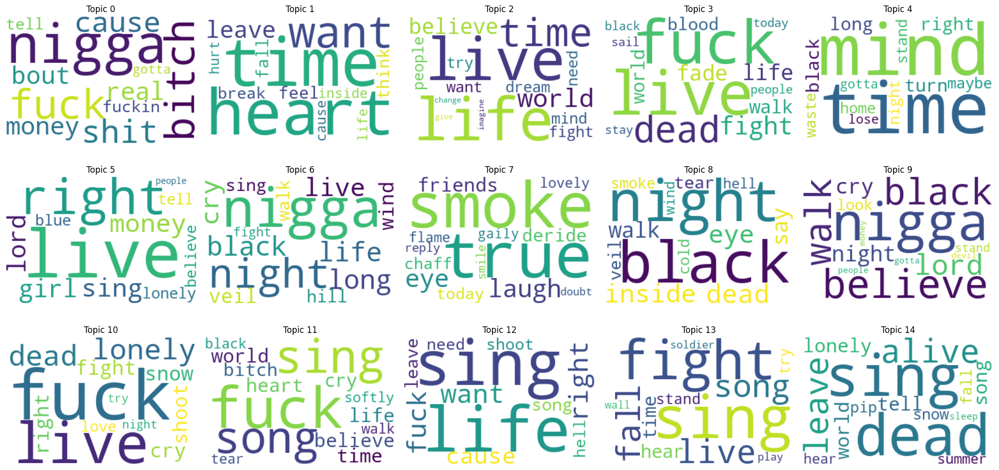

In [17]:
# Steps in this cell
## 1.Display the content of each topic

# get inspiration on:https://www.machinelearningplus.com/nlp/topic-modeling-visualization-how-to-present-results-lda-models/

stop_words_LSA = ['gonna','yeah','wanna','baby','away']
LSA_num_terms = 15

# Ask Chatgpt the code structure to display word cloud of each topics, modify the content to apply into my dataset
LSA_num_rows = 3
LSA_num_cols = 5
fig, axes = plt.subplots(LSA_num_rows, LSA_num_cols, figsize=(20, 10))

for i in range(LSA_num_topics):
    LSA_row = i // LSA_num_cols
    LSA_col = i % LSA_num_cols
    
    LSA_topic_name = "topic" + str(i)
    LSA_weighted_list = LSA_topic_weights[LSA_topic_name].sort_values(ascending=False)[:LSA_num_terms]
    
    LSA_filtered_keywords_LSA = [word for word in LSA_weighted_list.index.values if word.lower() not in stop_words_LSA]
    
    LSA_wordcloud_topic = WordCloud(width=300, height=200, background_color='white').generate(" ".join(LSA_filtered_keywords_LSA))
    
    axes[LSA_row, LSA_col].imshow(LSA_wordcloud_topic, interpolation='bilinear')
    axes[LSA_row, LSA_col].set_title('Topic {}'.format(i))
    axes[LSA_row, LSA_col].axis('off')

plt.tight_layout()
plt.show()

In [18]:
# Steps in this cell
## 1.Experiment with different topic numbers, and try to compare the results

### 3.2 LSA for Sampled Dataset

In [19]:
english_stop_words = stopwords.words('english')
sampled_LSA_stop_words = []
sampled_stop_words = english_stop_words + sampled_LSA_stop_words

sampled_LSA_vectorizer = TfidfVectorizer(stop_words=sampled_LSA_stop_words, ngram_range=(1,1))

# Calculate TF-IDF for each song containing death-related terms
sampled_LSA_tfidf_matrix = sampled_LSA_vectorizer.fit_transform(sampled_lyrics)

# Create DataFrame with TF-IDF values
sampled_LSA_tfidf_df = pd.DataFrame(sampled_LSA_tfidf_matrix.toarray(), index=sampled_bag_of_words_df['track_name'], columns=sampled_LSA_vectorizer.get_feature_names_out())

print("Sampled_TF-IDF for each song:")
print(sampled_LSA_tfidf_df)

Sampled_TF-IDF for each song:
                                         aaaa  aaaaaaa  aaaaaaaaaah  aaaaah  \
track_name                                                                    
velvet light                              0.0      0.0          0.0     0.0   
andy, you're a star                       0.0      0.0          0.0     0.0   
with a little luck                        0.0      0.0          0.0     0.0   
voodoo mon amour                          0.0      0.0          0.0     0.0   
gulf coast highway (with willie nelson)   0.0      0.0          0.0     0.0   
...                                       ...      ...          ...     ...   
since you're gone                         0.0      0.0          0.0     0.0   
president gas                             0.0      0.0          0.0     0.0   
with you gone                             0.0      0.0          0.0     0.0   
creeque alley                             0.0      0.0          0.0     0.0   
tell me how long      

In [20]:
sampled_LSA_tfidf_df = sampled_LSA_tfidf_df - sampled_LSA_tfidf_df.mean()

sampled_LSA_num_topics = 15
pd.options.display.max_columns=sampled_LSA_num_topics
labels = ['topic{}'.format(i) for i in range(sampled_LSA_num_topics)] 

sampled_svd = TruncatedSVD(n_components = sampled_LSA_num_topics, n_iter = 200)
sampled_svd_topic_vectors = sampled_svd.fit_transform(sampled_LSA_tfidf_df.values)

sampled_LSA_topic_weights = pd.DataFrame(sampled_svd.components_.T, index=sampled_LSA_tfidf_df.columns, columns=labels)

sampled_LSA_songs_topics_df = pd.DataFrame(sampled_svd_topic_vectors, index=sampled_data["track_name"].values, columns=labels)
sampled_LSA_songs_topics_df

,topic0,topic1,topic2,topic3,topic4,topic5,topic6,topic7,topic8,topic9,topic10,topic11,topic12,topic13,topic14
velvet light,-0.027175,-0.042135,-0.022482,0.010846,-0.011082,0.029907,-0.002298,-0.041534,-0.001123,-0.003135,0.006191,0.019465,-0.000078,0.050602,0.003813
"andy, you're a star",-0.052493,-0.003832,0.007749,-0.032827,-0.016552,0.019642,-0.003297,0.008543,-0.027927,-0.024470,-0.013606,-0.015803,-0.002767,0.038215,0.053039
with a little luck,-0.066638,-0.041091,-0.009761,0.009729,0.025843,0.029577,0.030132,-0.040796,-0.011868,0.006151,-0.048400,-0.000528,0.022391,-0.000476,0.017204
voodoo mon amour,-0.076027,-0.062983,-0.022698,-0.003312,-0.014955,0.028788,0.009906,-0.035124,-0.013446,0.004939,-0.026729,0.017632,0.000370,0.008228,0.009318
gulf coast highway (with willie nelson),0.042596,-0.140800,0.037976,0.097833,-0.046993,-0.027254,0.025505,0.067555,0.013030,-0.038540,-0.006908,0.052051,0.042481,-0.053002,0.102472
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
since you're gone,0.172323,-0.047463,0.065845,0.276563,0.022170,-0.349114,-0.315280,-0.398311,0.014610,-0.040705,0.116714,0.131860,-0.004897,0.154826,-0.029815
president gas,-0.064525,0.017697,-0.000212,0.003642,-0.012030,0.045876,0.023028,-0.033447,0.018894,-0.031957,-0.037066,-0.017178,-0.009698,0.017477,-0.008311
with you gone,0.188123,0.050067,-0.059133,0.208948,0.095450,-0.368951,-0.383456,-0.310042,-0.045150,-0.005842,0.041343,0.073883,-0.016972,0.132119,-0.038769
creeque alley,-0.036510,-0.018048,0.025649,0.003953,0.026230,0.017605,-0.014050,-0.007601,0.018617,-0.015458,0.025441,-0.018862,0.036535,-0.058162,-0.035863


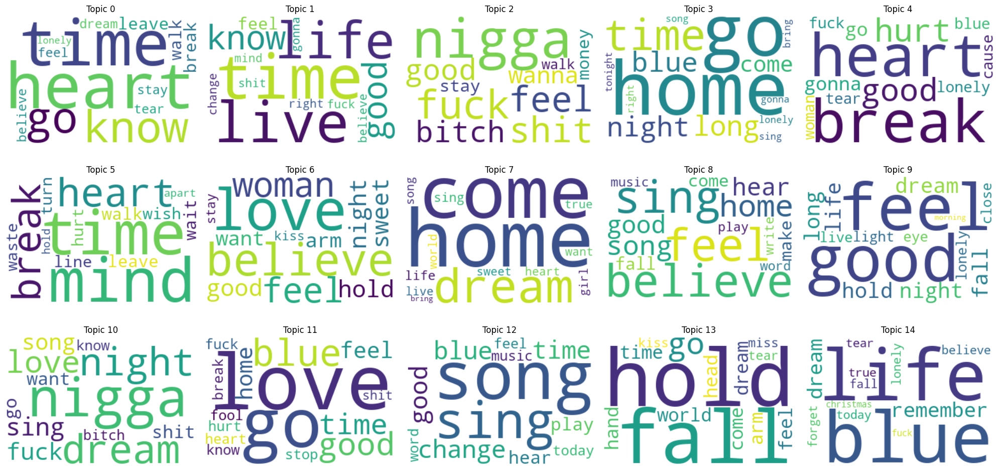

In [21]:
sampled_stop_words_LSA = ['baby','away','yeah']
sampled_LSA_num_terms = 15

# Ask Chatgpt the code structure to display word cloud of each topics, modify the content to apply into my dataset
sampled_LSA_num_rows = 3
sampled_LSA_num_cols = 5
fig, axes = plt.subplots(sampled_LSA_num_rows, sampled_LSA_num_cols, figsize=(20, 10))

for i in range(sampled_LSA_num_topics):
    sampled_LSA_row = i // sampled_LSA_num_cols
    sampled_LSA_col = i % sampled_LSA_num_cols
    
    sampled_topic_name = "topic" + str(i)
    sampled_LSA_weighted_list = sampled_LSA_topic_weights[sampled_topic_name].sort_values(ascending=False)[:sampled_LSA_num_terms]
    
    sampled_filtered_keywords_LSA = [word for word in sampled_LSA_weighted_list.index.values if word.lower() not in sampled_stop_words_LSA]
    
    sampled_LSA_wordcloud_topic = WordCloud(width=300, height=200, background_color='white').generate(" ".join(sampled_filtered_keywords_LSA))
    
    axes[sampled_LSA_row, sampled_LSA_col].imshow(sampled_LSA_wordcloud_topic, interpolation='bilinear')
    axes[sampled_LSA_row, sampled_LSA_col].set_title('Topic {}'.format(i))
    axes[sampled_LSA_row, sampled_LSA_col].axis('off')

plt.tight_layout()
plt.show()

In [22]:
# Compare death_data with sample_data
# 1. death_data gives us more negative topics and aggressive words like 'smoke' 'fuck' 'black' instead of 'love' 'home' 'good' 'kiss'.
# 2. death_data talks more about 'money'
# 3. Both dataset are talking about 'life' 'time' 'world'

## 4 Topic Modelling - LDA

### 4.1 LDA for Death Dataset

In [23]:
LDA_stop_words = []
LDA_stop_words = english_stop_words + LDA_stop_words
corpus = [' '.join(tokens) for tokens in tokenized_death_lyrics]
LDA_vectorizer = CountVectorizer(stop_words=LDA_stop_words, ngram_range=(1,1))
LDA_bag_of_words = LDA_vectorizer.fit_transform(corpus)
vocab = LDA_vectorizer.get_feature_names_out()

In [24]:
# Steps in this cell
## 1.Use LDA do each death-song's topic modelling
## 2.Display the song names and their corresponding topic weights

# Reference in this cell
## Finding the code in lecture-4-notebook and modify the content

LDA_num_topics = 20
pd.options.display.max_columns=LDA_num_topics
labels = ['topic{}'.format(i) for i in range(LDA_num_topics)]

lda = LatentDirichletAllocation(n_components=LDA_num_topics,random_state=123, learning_method='batch')
LDA_topics = lda.fit_transform(LDA_bag_of_words)
LDA_topic_weights = pd.DataFrame(lda.components_.T,index=vocab, columns=labels)

# Chatgpt
# Create a DataFrame with song names and their corresponding topic weights
LDA_songs_topics_df = pd.DataFrame(LDA_topics, index=data_death["track_name"].values, columns=labels)
LDA_songs_topics_df

,topic0,topic1,topic2,topic3,topic4,topic5,topic6,topic7,topic8,topic9,topic10,topic11,topic12,topic13,topic14,topic15,topic16,topic17,topic18,topic19
i believe,0.000962,0.000962,0.000962,0.000962,0.000962,0.102345,0.263240,0.000962,0.000962,0.000962,0.000962,0.000962,0.000962,0.618069,0.000962,0.000962,0.000962,0.000962,0.000962,0.000962
round and round (with mitchell ayres and his orchestra & the ray charles singers),0.000505,0.000505,0.000505,0.000505,0.000505,0.000505,0.000505,0.000505,0.000505,0.000505,0.131887,0.113977,0.000505,0.745550,0.000505,0.000505,0.000505,0.000505,0.000505,0.000505
necessary evil,0.000284,0.000284,0.000284,0.000284,0.196064,0.054352,0.011683,0.165091,0.000284,0.000284,0.000284,0.000284,0.348520,0.000284,0.000284,0.220312,0.000284,0.000284,0.000284,0.000284
dark eyes,0.000273,0.000273,0.000273,0.000273,0.044936,0.084079,0.000273,0.000273,0.000273,0.000273,0.000273,0.000273,0.000273,0.329838,0.000273,0.199104,0.337945,0.000273,0.000273,0.000273
jahan men log sachhe ashikon ko,0.000588,0.000588,0.018222,0.000588,0.000588,0.000588,0.000588,0.000588,0.000588,0.000588,0.000588,0.000588,0.000588,0.971189,0.000588,0.000588,0.000588,0.000588,0.000588,0.000588
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
the champ,0.000549,0.000549,0.575021,0.000549,0.356744,0.000549,0.000549,0.000549,0.000549,0.000549,0.000549,0.000549,0.000549,0.000549,0.058894,0.000549,0.000549,0.000549,0.000549,0.000549
gook,0.000602,0.000602,0.602582,0.000602,0.386575,0.000602,0.000602,0.000602,0.000602,0.000602,0.000602,0.000602,0.000602,0.000602,0.000602,0.000602,0.000602,0.000602,0.000602,0.000602
tony montana,0.000794,0.000794,0.000794,0.520224,0.299645,0.000794,0.000794,0.000794,0.000794,0.000794,0.000794,0.000794,0.000794,0.000794,0.000794,0.166639,0.000794,0.000794,0.000794,0.000794
kill 'em all,0.000641,0.000641,0.000641,0.000641,0.257397,0.000641,0.000641,0.000641,0.000641,0.345507,0.000641,0.000641,0.000641,0.080027,0.000641,0.234030,0.073424,0.000641,0.000641,0.000641


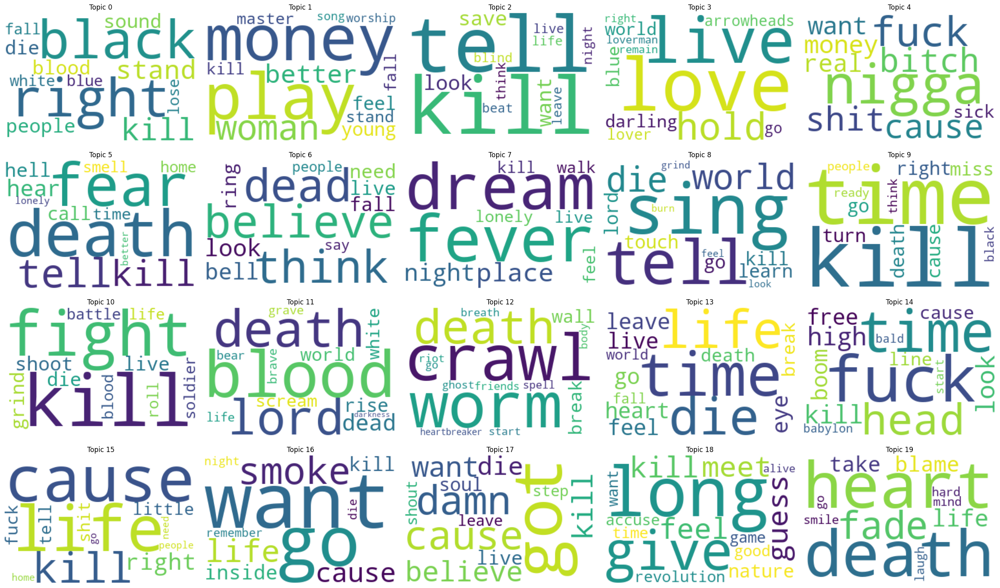

In [25]:
# Steps in this cell
## 1.Display the content of each topic

# Reference in this cell
## Finding the code in lecture-4-notebook and modify the content

stop_words_LDA = ['gonna','yeah','wanna','baby','away','gon','wan','ohoh','na','ta','come','know']
LDA_num_terms = 15

# Ask Chatgpt the code structure to display word cloud of each topics, modify the content to apply into my dataset
LDA_num_rows = 4
LDA_num_cols = 5
fig, axes = plt.subplots(LDA_num_rows, LDA_num_cols, figsize=(25, 15))

for i in range(LDA_num_topics):
    LDA_row = i // LDA_num_cols
    LDA_col = i % LDA_num_cols
    
    topic_name = "topic" + str(i)
    LDA_weighted_list = LDA_topic_weights[topic_name].sort_values(ascending=False)[:LDA_num_terms]
    
    filtered_keywords_LDA = [word for word in LDA_weighted_list.index.values if word.lower() not in stop_words_LDA]
    
    LDA_wordcloud_topic = WordCloud(width=300, height=200, background_color='white').generate(" ".join(filtered_keywords_LDA))
    
    axes[LDA_row, LDA_col].imshow(LDA_wordcloud_topic, interpolation='bilinear')
    axes[LDA_row, LDA_col].set_title('Topic {}'.format(i))
    axes[LDA_row, LDA_col].axis('off')

plt.tight_layout()
plt.show()

### 4.2 LDA for Sampled Dataset

In [26]:
LDA_sampled_stop_words = []
LDA_sampled_stop_words = english_stop_words + LDA_sampled_stop_words
sampled_corpus = [' '.join(tokens) for tokens in tokenized_sampled_lyrics]
LDA_sampled_vectorizer = CountVectorizer(stop_words=LDA_sampled_stop_words, ngram_range=(1,1))
LDA_sampled_bag_of_words = LDA_sampled_vectorizer.fit_transform(sampled_corpus)
vocab = LDA_sampled_vectorizer.get_feature_names_out()

In [27]:
LDA_sampled_num_topics = 20
pd.options.display.max_columns=LDA_sampled_num_topics
labels = ['topic{}'.format(i) for i in range(LDA_sampled_num_topics)]

sampled_lda = LatentDirichletAllocation(n_components=LDA_sampled_num_topics,random_state=123, learning_method='batch')
LDA_sampled_topics = sampled_lda.fit_transform(LDA_sampled_bag_of_words)
LDA_sampled_topic_weights = pd.DataFrame(sampled_lda.components_.T,index=vocab, columns=labels)

# Chatgpt
# Create a DataFrame with song names and their corresponding topic weights
LDA_sampled_songs_topics_df = pd.DataFrame(LDA_sampled_topics, index=sampled_data["track_name"].values, columns=labels)
LDA_sampled_songs_topics_df

,topic0,topic1,topic2,topic3,topic4,topic5,topic6,topic7,topic8,topic9,topic10,topic11,topic12,topic13,topic14,topic15,topic16,topic17,topic18,topic19
velvet light,0.002174,0.002174,0.002174,0.002174,0.002174,0.002174,0.456207,0.002174,0.002174,0.002174,0.283161,0.002174,0.002174,0.002174,0.002174,0.223676,0.002174,0.002174,0.002174,0.002174
"andy, you're a star",0.824486,0.001000,0.001000,0.001000,0.001000,0.001000,0.157514,0.001000,0.001000,0.001000,0.001000,0.001000,0.001000,0.001000,0.001000,0.001000,0.001000,0.001000,0.001000,0.001000
with a little luck,0.000329,0.000329,0.000329,0.993750,0.000329,0.000329,0.000329,0.000329,0.000329,0.000329,0.000329,0.000329,0.000329,0.000329,0.000329,0.000329,0.000329,0.000329,0.000329,0.000329
voodoo mon amour,0.000847,0.000847,0.000847,0.000847,0.000847,0.000847,0.000847,0.000847,0.000847,0.000847,0.000847,0.000847,0.000847,0.000847,0.000847,0.983898,0.000847,0.000847,0.000847,0.000847
gulf coast highway (with willie nelson),0.000543,0.000543,0.000543,0.000543,0.000543,0.000543,0.694856,0.149687,0.065341,0.081420,0.000543,0.000543,0.000543,0.000543,0.000543,0.000543,0.000543,0.000543,0.000543,0.000543
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
since you're gone,0.000575,0.063304,0.000575,0.000575,0.000575,0.751109,0.000575,0.000575,0.000575,0.175817,0.000575,0.000575,0.000575,0.000575,0.000575,0.000575,0.000575,0.000575,0.000575,0.000575
president gas,0.288164,0.000658,0.000658,0.000658,0.000658,0.000658,0.699994,0.000658,0.000658,0.000658,0.000658,0.000658,0.000658,0.000658,0.000658,0.000658,0.000658,0.000658,0.000658,0.000658
with you gone,0.069756,0.000704,0.000704,0.000704,0.000704,0.345928,0.210824,0.224608,0.000704,0.000704,0.000704,0.000704,0.138320,0.000704,0.000704,0.000704,0.000704,0.000704,0.000704,0.000704
creeque alley,0.000417,0.000417,0.000417,0.000417,0.787747,0.000417,0.000417,0.000417,0.000417,0.000417,0.000417,0.133285,0.000417,0.000417,0.000417,0.000417,0.000417,0.000417,0.071885,0.000417


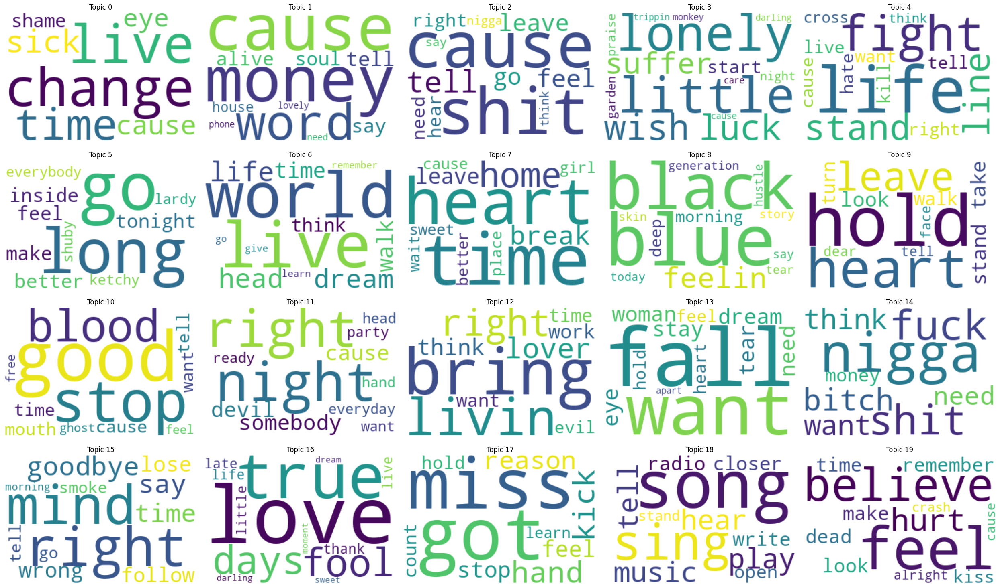

In [28]:
sampled_stop_words_LDA = ['gonna','yeah','wanna','baby','away','gon','wan','ohoh','na','ta','come','know']
LDA_sampled_num_terms = 15

# Ask Chatgpt the code structure to display word cloud of each topics, modify the content to apply into my dataset
LDA_sampled_num_rows = 4
LDA_sampled_num_cols = 5
fig, axes = plt.subplots(LDA_sampled_num_rows, LDA_sampled_num_cols, figsize=(25, 15))

for i in range(LDA_sampled_num_topics):
    LDA_sampled_row = i // LDA_sampled_num_cols
    LDA_sampled_col = i % LDA_sampled_num_cols
    
    sampled_topic_name = "topic" + str(i)
    LDA_sampled_weighted_list = LDA_sampled_topic_weights[sampled_topic_name].sort_values(ascending=False)[:LDA_sampled_num_terms]
    
    sampled_filtered_keywords_LDA = [word for word in LDA_sampled_weighted_list.index.values if word.lower() not in sampled_stop_words_LDA]
    
    sampled_LDA_wordcloud_topic = WordCloud(width=300, height=200, background_color='white').generate(" ".join(sampled_filtered_keywords_LDA))
    
    axes[LDA_sampled_row, LDA_sampled_col].imshow(sampled_LDA_wordcloud_topic, interpolation='bilinear')
    axes[LDA_sampled_row, LDA_sampled_col].set_title('Topic {}'.format(i))
    axes[LDA_sampled_row, LDA_sampled_col].axis('off')

plt.tight_layout()
plt.show()

In [29]:
# Steps in this cell
## 1.Experiment with different topic numbers, and try to compare the results

In [30]:
# Steps in this cell
## 1.Compare Quantitative metrics(Perplexity and Coherence) with Human judgment(My observation)
## 2.Compare the topic content under different perplexity and coherence value

## 5 Use classified lyrics to do Topic Modelling

### 5.1 LDA for Genre Feature

In [54]:
# Steps in this cell
## 1.Use 'genre' column to classify the song lyrics
## 2.Display the different proportion between whole-song-lyrics and death-song-lyrics

lyrics_data = data_death['lyrics']
genre_data = data_death['genre']
genre_topics_dict = {}
genre_stop_words = ['kill','death','die','come','know','time','life','live','go','away','yeah']

for genre in set(genre_data):
    subset = lyrics_data[genre_data == genre]
    
    count_vectorizer = CountVectorizer(stop_words=genre_stop_words)
    bag_of_words = count_vectorizer.fit_transform(subset)
    
    num_topics = 20
    lda = LatentDirichletAllocation(n_components=num_topics, random_state=123, learning_method='batch')
    topics = lda.fit_transform(bag_of_words)
    
    topic_words_dict = {}
    for i, topic in enumerate(lda.components_):
        top_words_idx = topic.argsort()[-15:][::-1]
        top_words = [count_vectorizer.get_feature_names_out()[idx] for idx in top_words_idx]
        topic_words_dict[f'Topic {i + 1}'] = top_words
    
    genre_topics_dict[genre] = topic_words_dict

for genre, topics_dict in genre_topics_dict.items():
    print(f"Genre: {genre}")
    print("Top words for each topic:")
    for topic, top_words in topics_dict.items():
        print(f"{topic}: {', '.join(top_words)}")
    print("=" * 50)

Genre: pop
Top words for each topic:
Topic 1: bitch, feel, like, nasty, want, ohoh, need, good, year, fuck, knife, right, look, lasagna, gucci
Topic 2: stay, fever, like, leave, kiss, night, wrong, cause, gonna, eye, sweet, tonight, feel, alright, right
Topic 3: believe, turn, gotta, like, home, alive, break, leave, feet, ohoh, spin, phone, gonna, weezy, little
Topic 4: world, hold, sing, wanna, fight, place, walk, remember, better, arm, learn, people, forget, tell, like
Topic 5: world, look, like, feel, rain, hand, eye, dream, word, hear, think, build, stand, play, remember
Topic 6: heart, good, cry, think, blue, like, break, feel, night, baby, eye, inside, hold, look, mind
Topic 7: better, save, give, dead, dream, wanna, street, kid, work, like, lose, wait, crash, say, feel
Topic 8: stand, look, change, people, start, lonely, tell, stay, like, lie, try, walk, dream, think, anymore
Topic 9: tire, dance, apart, wanna, home, control, energy, nananana, eye, ready, fall, songs, cause, hea

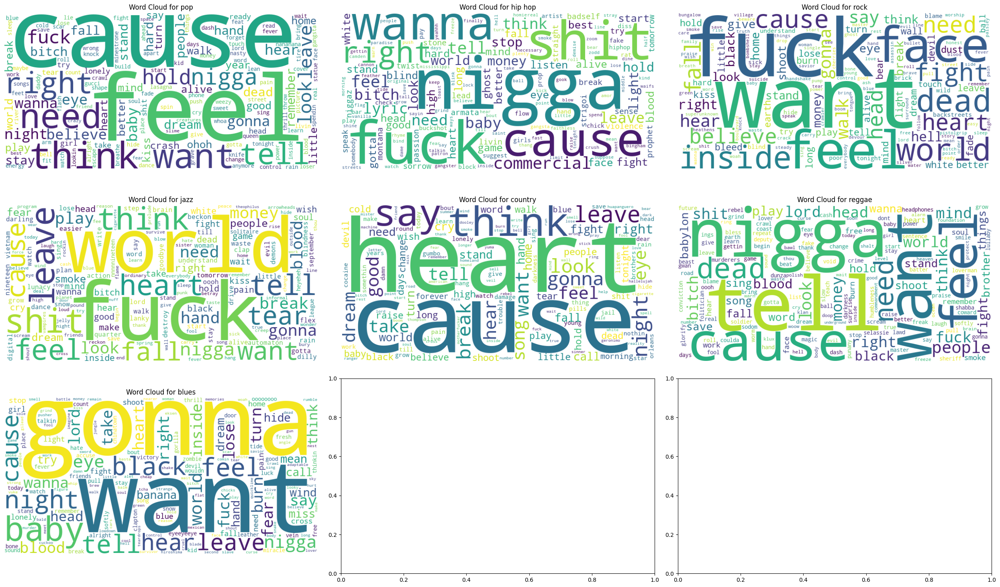

In [55]:
# FInd code in STEM-Notebook and Ask CHATGPT to create for-loop for wordcloud display
num_genres = len(genre_topics_dict)
genre_cols = 3  
genre_rows = 3

fig, axes = plt.subplots(genre_cols, genre_rows, figsize=(25, 15))

for i, (genre, genre_topics) in enumerate(genre_topics_dict.items()):
    genre_all_words = ""
    
    for genre_topic, genre_top_words in genre_topics.items():
        genre_all_words += " ".join(genre_top_words) + " "
    
    col = i % genre_cols
    row = i // genre_rows

    wordcloud_death_genre = WordCloud(width=800, height=400, background_color='white').generate(genre_all_words)

    axes[row, col].imshow(wordcloud_death_genre, interpolation='bilinear')
    axes[row, col].set_title(f"Word Cloud for {genre}")
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

### 5.2 LDA for Released_Date Feature

In [46]:
# Same steps of using 'release_date' column to explore the connection between the expression of death in lyrics and released date
lyrics_data = data_death['lyrics']
data_death['release_date'] = data_death['release_date'].astype(str)
data_death['decade'] = (data_death['release_date'].str[:-1] + '0').astype('category')
date_data = data_death['decade']
date_topics_dict = {}
date_stop_words=['know','come','kill','death','die','go','time','dead','yeah','life','cause']

for release_date in set(date_data):
    subset = lyrics_data[date_data == release_date]
    
    count_vectorizer = CountVectorizer(stop_words=date_stop_words)
    bag_of_words = count_vectorizer.fit_transform(subset)
    
    num_topics = 20
    lda = LatentDirichletAllocation(n_components=num_topics, random_state=123, learning_method='batch')
    topics = lda.fit_transform(bag_of_words)
    
    topic_words_dict = {}
    for i, topic in enumerate(lda.components_):
        top_words_idx = topic.argsort()[-15:][::-1]
        top_words = [count_vectorizer.get_feature_names_out()[idx] for idx in top_words_idx]
        topic_words_dict[f'Topic {i + 1}'] = top_words
    
    date_topics_dict[release_date] = topic_words_dict

for date, topics_dict in date_topics_dict.items():
    print(f"Release_Date: {date}")
    print("Top words for each topic:")
    for topic, top_words in topics_dict.items():
        print(f"{topic}: {', '.join(top_words)}")
    print("=" * 50)

Release_Date: 1980
Top words for each topic:
Topic 1: break, like, stand, blue, spell, black, true, worm, tonight, fight, home, gonna, heart, right, feet
Topic 2: heart, away, alive, need, beat, wild, slip, turn, tell, look, night, think, eye, say, dream
Topic 3: world, stay, night, feel, fever, leave, lovin, need, bring, till, live, look, stand, hard, hiroshima
Topic 4: blind, touch, young, kiss, fall, save, like, accuse, machine, promise, luck, devil, paradise, lie, stand
Topic 5: like, devil, boom, fight, friends, thinkin, home, island, nigga, hurry, wanna, zombie, destroy, vietnam, yeaheah
Topic 6: inside, burn, hell, assassin, deep, evil, like, curse, thrill, fight, green, write, control, ready, warrior
Topic 7: hear, heart, paisley, snow, dust, desperate, china, place, sing, want, cry, lie, blood, away, huapanguero
Topic 8: break, give, easy, lookin, like, lord, nigga, blue, thank, want, money, ensemble, thingfish, need, night
Topic 9: live, world, dream, inside, cars, fear, want

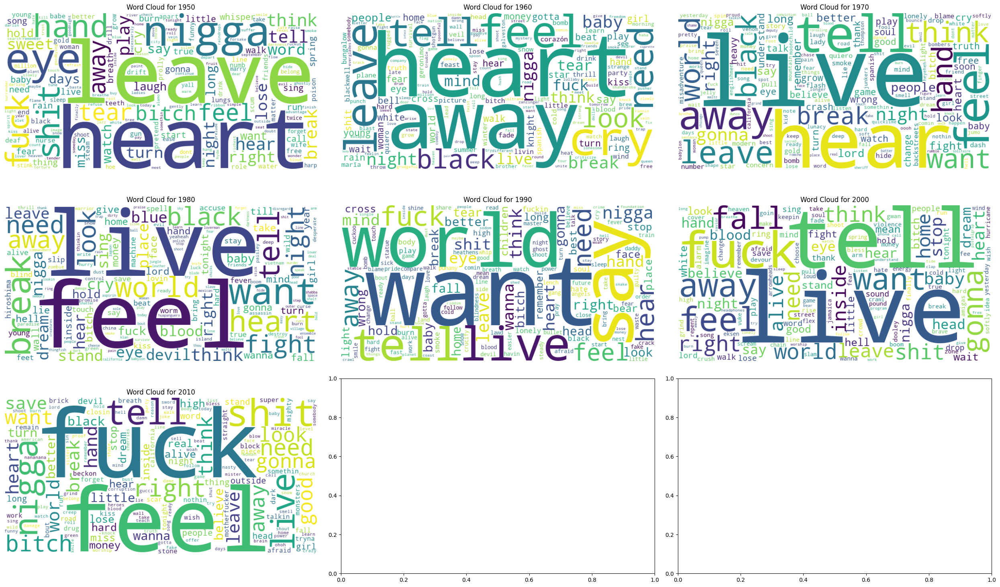

In [49]:
#FInd code in STEM-Notebook and Ask CHATGPT to create for-loop for wordcloud display
from collections import OrderedDict

date_topics_dict = OrderedDict(sorted(date_topics_dict.items()))

num_dates = len(date_topics_dict)
date_cols = 3  
date_rows = 3

fig, axes = plt.subplots(date_cols, date_rows, figsize=(25, 15))

for i, (date, topics_dict) in enumerate(date_topics_dict.items()):
    all_words = ""
    
    for topic, top_words in topics_dict.items():
        all_words += " ".join(top_words) + " "
    
    col = i % date_cols
    row = i // date_cols

    date_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_words)

    axes[row, col].imshow(date_wordcloud, interpolation='bilinear')
    axes[row, col].set_title(f"Word Cloud for {date}")
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()

### 5.3 LDA for Topic Feature

In [56]:
# Same steps of using 'topics' column to explore the connection between the expression of death in lyrics and song topics
lyrics_data = data_death['lyrics']
rawtopic_data = data_death['topic']
topic_stop_words = ['come','know']
rawtopic_topics_dict = {}

for rawtopic in set(rawtopic_data):
    subset = lyrics_data[rawtopic_data == rawtopic]
    
    count_vectorizer = CountVectorizer(stop_words=topic_stop_words)
    bag_of_words = count_vectorizer.fit_transform(subset)
    
    num_topics = 10
    lda = LatentDirichletAllocation(n_components=num_topics, random_state=123, learning_method='batch')
    topics = lda.fit_transform(bag_of_words)
    
    topic_words_dict = {}
    for i, topic in enumerate(lda.components_):
        top_words_idx = topic.argsort()[-15:][::-1]
        top_words = [count_vectorizer.get_feature_names_out()[idx] for idx in top_words_idx]
        topic_words_dict[f'Topic {i + 1}'] = top_words
    
    rawtopic_topics_dict[rawtopic] = topic_words_dict

for rawtopic, topics_dict in rawtopic_topics_dict.items():
    print(f"TOPIC: {rawtopic}")
    print("Top words for each topic:")
    for topic, top_words in topics_dict.items():
        print(f"{topic}: {', '.join(top_words)}")
    print("=" * 50)

TOPIC: feelings
Top words for each topic:
Topic 1: true, want, hate, feel, love, hide, yeah, world, like, place, hurt, life, spoil, contact, respect
Topic 2: ohoh, feel, good, girl, ohohoh, whoaoh, kiss, skin, weight, arm, crawl, heroin, pray, hide, place
Topic 3: go, good, like, wrong, baby, world, soldier, real, life, fuck, battle, field, fall, miss, tell
Topic 4: miss, go, fever, girl, die, like, shall, whoa, death, rise, temperature, feel, cold, close, think
Topic 5: true, want, hate, feel, love, hide, yeah, world, like, place, hurt, life, spoil, contact, respect
Topic 6: feel, go, lovin, like, morning, baby, bring, whoa, hate, psycho, live, tightrope, cause, want, eye
Topic 7: feel, long, daddy, die, time, moment, matter, felt, sign, tender, gentleman, days, things, hard, child
Topic 8: true, want, hate, feel, love, hide, yeah, world, like, place, hurt, life, spoil, contact, respect
Topic 9: good, go, get, kill, take, move, little, shoot, happen, strong, kind, somethin, sittin, ye

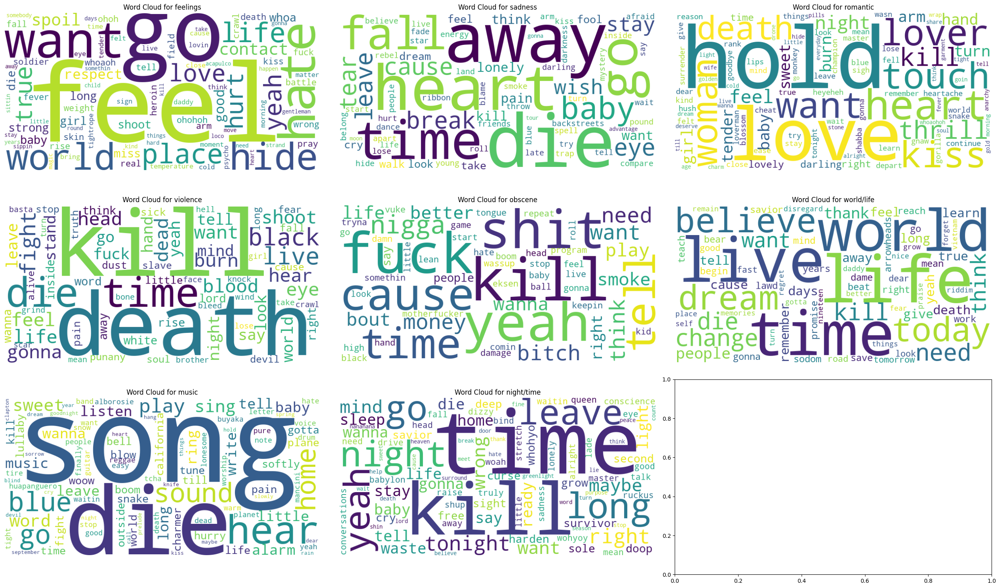

In [57]:
#FInd code in STEM-Notebook and Ask CHATGPT to create for-loop for wordcloud display
num_topics = len(rawtopic_topics_dict)
topic_cols = 3
topic_rows = 3

fig, axes = plt.subplots(topic_cols, topic_rows, figsize=(25, 15))

for i, (rawtopic, topics_dict) in enumerate(rawtopic_topics_dict.items()):
    all_words = ""
    
    for topic, top_words in topics_dict.items():
        all_words += " ".join(top_words) + " "
   
    col = i % topic_cols
    row = i // topic_rows
    rawtopic_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_words)

    axes[row, col].imshow(rawtopic_wordcloud, interpolation='bilinear')
    axes[row, col].set_title(f"Word Cloud for {rawtopic}")
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()